<img align="left" src="https://lever-client-logos.s3.amazonaws.com/864372b1-534c-480e-acd5-9711f850815c-1524247202159.png" width=200>
<br></br>
<br></br>

# Sprint Challenge
## *Data Science Unit 4 Sprint 1*

After a week of Natural Language Processing, you've learned some cool new stuff: how to process text, how turn text into vectors, and how to model topics from documents. Apply your newly acquired skills to one of the most famous NLP datasets out there: [Yelp](https://www.yelp.com/dataset/challenge). As part of the job selection process, some of my friends have been asked to create analysis of this dataset, so I want to empower you to have a head start.  

The real dataset is massive (almost 8 gigs uncompressed). I've sampled the data for you to something more managable for the Sprint Challenge. You can analyze the full dataset as a stretch goal or after the sprint challenge. As you work on the challenge, I suggest adding notes about your findings and things you want to analyze in the future.

## Challenge Objectives
*Successfully complete these all these objectives to earn a 2. There are more details on each objective further down in the notebook.*
* <a href="#p1">Part 1</a>: Write a function to tokenize the yelp reviews
* <a href="#p2">Part 2</a>: Create a vector representation of those tokens
* <a href="#p3">Part 3</a>: Use your tokens in a classification model on yelp rating
* <a href="#p4">Part 4</a>: Estimate & Interpret a topic model of the Yelp reviews

In [74]:
import numpy as np
import gensim
import os
import re

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import NearestNeighbors

from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from gensim import corpora

from gensim.models.ldamulticore import LdaMulticore

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
yelp = pd.read_json('./data/review_sample.json', lines=True)

In [3]:
yelp.head()

,business_id,cool,date,funny,review_id,stars,text,useful,user_id
0,nDuEqIyRc8YKS1q1fX0CZg,1,2015-03-31 16:50:30,0,eZs2tpEJtXPwawvHnHZIgQ,1,"BEWARE!!! FAKE, FAKE, FAKE....We also own a sm...",10,n1LM36qNg4rqGXIcvVXv8w
1,eMYeEapscbKNqUDCx705hg,0,2015-12-16 05:31:03,0,DoQDWJsNbU0KL1O29l_Xug,4,Came here for lunch Togo. Service was quick. S...,0,5CgjjDAic2-FAvCtiHpytA
2,6Q7-wkCPc1KF75jZLOTcMw,1,2010-06-20 19:14:48,1,DDOdGU7zh56yQHmUnL1idQ,3,I've been to Vegas dozens of times and had nev...,2,BdV-cf3LScmb8kZ7iiBcMA
3,k3zrItO4l9hwfLRwHBDc9w,3,2010-07-13 00:33:45,4,LfTMUWnfGFMOfOIyJcwLVA,1,We went here on a night where they closed off ...,5,cZZnBqh4gAEy4CdNvJailQ
4,6hpfRwGlOzbNv7k5eP9rsQ,1,2018-06-30 02:30:01,0,zJSUdI7bJ8PNJAg4lnl_Gg,4,"3.5 to 4 stars\n\nNot bad for the price, $12.9...",5,n9QO4ClYAS7h9fpQwa5bhA


In [4]:
yelp.shape

(10000, 9)

## Part 1: Tokenize Function
<a id="#p1"></a>

Complete the function `tokenize`. Your function should
- accept one document at a time
- return a list of tokens

You are free to use any method you have learned this week.

In [84]:
STOPWORDS = set(STOPWORDS).union(set([
    'ive', 've', 'going', 'place', 'like', 'time', 'got', 'come', 'i', 'im', 'dont', 'didnt', 'service', 'good', 'food', 'try', 'great',
    'order', 'ordered', 'said', 'went', 'told', 'people', 'came', 'restaurant',

]))

def tokenize(text):
    text = re.sub(r'[^a-zA-Z ^0-9]', '', text)
    text = (text.
            replace('\n', ' ')
           )
    return [token for token in simple_preprocess(text) if token not in STOPWORDS]

In [85]:
yelp['tokens'] = yelp['text'].apply(lambda x: tokenize(x))

In [86]:
yelp['tokens'].head()

0    [beware, fake, fake, fakewe, small, business, ...
1    [lunch, togo, quick, staff, friendly, complain...
2    [vegas, dozens, times, stepped, foot, circus, ...
3    [night, closed, street, party, best, actually,...
4    [starsnot, bad, price, lunch, seniors, pay, ea...
Name: tokens, dtype: object

## Part 2: Vector Representation
<a id="#p2"></a>
1. Create a vector representation of the reviews
2. Write a fake review and query for the 10 most similiar reviews, print the text of the reviews. Do you notice any patterns?
    - Given the size of the dataset, it will probably be best to use a `NearestNeighbors` model for this. 

In [13]:
tfidf = TfidfVectorizer(stop_words=STOPWORDS, max_df=0.97, min_df=3, ngram_range=(1,2), max_features=4000)

# Create a vocabulary and get word counts per document
dtm = tfidf.fit_transform(yelp['text'])

# Get feature names to use as dataframe column headers
dtm = pd.DataFrame(dtm.todense(), columns=tfidf.get_feature_names())

# View Feature Matrix as DataFrame
dtm.head()

,00,000,00pm,10,10 10,10 15,10 minutes,10 years,100,10pm,...,york,young,younger,yuk,yum,yummy,zero,zero stars,zucchini,était
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.084464,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [14]:
dtm.sum().sort_values(ascending=False)[:10]

love          169.829612
best          166.883005
nice          154.803967
staff         153.067067
amazing       152.039788
friendly      146.110945
definitely    136.741622
chicken       130.663845
delicious     129.593068
order         127.552726
dtype: float64

In [15]:
nn  = NearestNeighbors(n_neighbors=10, algorithm='kd_tree')
nn.fit(dtm)

NearestNeighbors(algorithm='kd_tree', leaf_size=30, metric='minkowski',
         metric_params=None, n_jobs=None, n_neighbors=10, p=2, radius=1.0)

In [16]:
bad_review = ["overpriced, terrible service and lousy food"]

In [17]:
new_bad = tfidf.transform(bad_review)

In [18]:
ten_sim = nn.kneighbors(new_bad.todense())[1][0].tolist()

In [19]:
ten_sim

[6311, 6204, 5298, 2627, 2135, 2203, 708, 4673, 6469, 7548]

In [20]:
for item in ten_sim[2:]:
    print(yelp['text'][item])
    print()

Terrible.. absolutely terrible. Dr. Hinds is especially rude, very difficult to get anyone to return a phone call, just overall terrible patient care.

Terrible terrible terrible went to get a "hot and ready pizza and box" which is supposed to be ready between the hours of 4 and 8 p.m. at 7:24 p.m. here it is 8 p.m. and I still have not received my order which I was told would be ready in 12 to 15 minutes this place is terrible terrible terrible and I will no longer be spending my money at this particular little Little Caesars if any Little Caesars Domino's here I come

Terrible airline. They have nothing to offer accept a ride. Why is it that airlines have terrible business models? Virgin America is my favorite. We need more Airlines like them.

Paid $45 for a terrible gel pedicure, have to get my toes redone.  Overpriced and bad work.  Only reason they get 2 stars is because the nail tech was friendly.

Food was good, but overpriced. This is a gringo's restaurant, not one for Mexican

In [21]:
good_review = ["Lots of fun, amazing service, exciting atmosphere. Can’t wait to come back!"]

In [22]:
new_good = tfidf.transform(good_review)
ten_sim = nn.kneighbors(new_good.todense())[1][0].tolist()
ten_sim

[6204, 6311, 123, 9297, 4905, 5007, 4496, 6747, 8602, 6842]

In [23]:
for item in ten_sim[2:]:
    print(yelp['text'][item])
    print()

Amazing food! Amazing service! Tons of fun! Come here if you want to have a great night!

Whimsical, fun and gorgeous. A very nice walkthrough - and the butterflies in the greenhouse were a fun touch.

Fabulous fun small place with excellent bar and fantastic menu. Salads, dogs and sandwiches are all good. Atmosphere is cozy, friendly and fun!

Food was good , nice presentation. Good atmosphere fun decor with the bamboo and paper lanterns. Service was average

We eat here regularly. Food is fresh. What an exciting environment! I wish they would add baked potatoes and more appetizers.

The reviews on this place are pretty high so I was excited to check it out. I ordered a pizza and a calzone. Both were decent but nothing too exciting. I'd be interested to try them for dinner and see how their pasta and other dishes are.

Not exactly all that! Most of the meats are good but there was a few that were just plain. The pre-made taco shells are awful! Who does this, it takes no time at all to

## Part 3: Classification
<a id="#p3"></a>
Your goal in this section will be to predict `stars` from the review dataset. 

1. Create a piepline object with a sklearn `CountVectorizer` or `TfidfVector` and any sklearn classifier. Use that pipeline to estimate a model to predict `stars`. Use the Pipeline to predict a star rating for your fake review from Part 2. 
2. Tune the entire pipeline with a GridSearch

In [96]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

In [97]:
train, test = train_test_split(yelp[['text', 'stars']], test_size=0.2, random_state=42)
train.shape, test.shape

((8000, 2), (2000, 2))

In [98]:
train.head()

,text,stars
9254,Be warned now: their sauce is super sweet. Not...,2
1561,An accurate depiction of a hidden gem. Tups is...,5
1670,Excellent food and service. Had the saag panee...,5
6087,This place is awesome! It feels like the best ...,5
6669,I am the unfortunate tenant from Barrett Eastm...,2


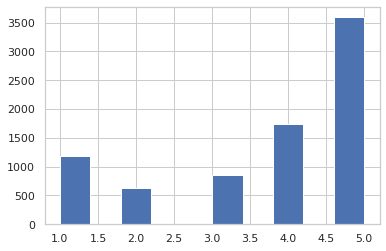

In [99]:
train['stars'].hist()

In [100]:
vect = TfidfVectorizer(stop_words='english', ngram_range=(1,2))
clf = RandomForestClassifier()

pipe = Pipeline([('vect', vect), ('clf', clf)])

parameters = {
    'vect__max_df': ( 0.75, 1.0),
    'vect__min_df': (.02, .05),
    'vect__max_features': (500,1000),
    'clf__n_estimators':(5, 10,),
    'clf__max_depth':(15,20)
}

grid_search = GridSearchCV(pipe,parameters, cv=5, n_jobs=-1, verbose=1)
grid_search.fit(train['text'], train['stars'])

Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:  1.0min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=Pipeline(memory=None,
     steps=[('vect', TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.float64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 2), norm='l2', preprocessor=None, smooth_idf=True,
...obs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False))]),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'vect__max_df': (0.75, 1.0), 'vect__min_df': (0.02, 0.05), 'vect__max_features': (500, 1000), 'clf__n_estimators': (5, 10), 'clf__max_depth': (15, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [101]:
grid_search.best_score_

0.54275

In [102]:
pred = grid_search.predict(good_review)
pred

array([5])

## top tokens / words in good and bad reviews. Good reviews have better than 3 stars and bad reviews are 3 or less

In [87]:
yelp_good = yelp[yelp['stars'] > 3]
yelp_bad = yelp[yelp['stars'] <= 3]

yelp_good.shape, yelp_bad.shape

((6647, 10), (3353, 10))

In [88]:
yelp_good.head()

,business_id,cool,date,funny,review_id,stars,text,useful,user_id,tokens
1,eMYeEapscbKNqUDCx705hg,0,2015-12-16 05:31:03,0,DoQDWJsNbU0KL1O29l_Xug,4,Came here for lunch Togo. Service was quick. S...,0,5CgjjDAic2-FAvCtiHpytA,"[lunch, togo, quick, staff, friendly, complain..."
4,6hpfRwGlOzbNv7k5eP9rsQ,1,2018-06-30 02:30:01,0,zJSUdI7bJ8PNJAg4lnl_Gg,4,"3.5 to 4 stars\n\nNot bad for the price, $12.9...",5,n9QO4ClYAS7h9fpQwa5bhA,"[starsnot, bad, price, lunch, seniors, pay, ea..."
5,Db3CfZWrtG33UZSs8Tdlsg,1,2016-10-23 22:43:56,1,nXYV_0joQEMXYAfNyOPsRw,4,"Tasty, fast casual Latin street food. The men...",1,Gjz2PCbLZ6midk1n_0LaUg,"[tasty, fast, casual, latin, street, menu, ove..."
6,gJhMeq2nVH27tz8LqbD3eQ,0,2013-05-20 19:09:43,0,ZA7SRi6fTRWwpo-B9O72qQ,5,This show is absolutely amazing!! What an incr...,0,BeKPVuqX-2at4izqVwUFEg,"[absolutely, amazing, incredible, production, ..."
7,Yt5gK4E9NqVa14WNiQdBlQ,0,2018-07-12 01:19:53,0,4_GnHPkyTirzK6onIKO4jw,4,Came for the Pho and really enjoyed it! We go...,0,PuXpIJzTBQejeBZh9hwynQ,"[pho, enjoyed, pm, busy, served, right, away, ..."


In [89]:
yelp_bad.head()

,business_id,cool,date,funny,review_id,stars,text,useful,user_id,tokens
0,nDuEqIyRc8YKS1q1fX0CZg,1,2015-03-31 16:50:30,0,eZs2tpEJtXPwawvHnHZIgQ,1,"BEWARE!!! FAKE, FAKE, FAKE....We also own a sm...",10,n1LM36qNg4rqGXIcvVXv8w,"[beware, fake, fake, fakewe, small, business, ..."
2,6Q7-wkCPc1KF75jZLOTcMw,1,2010-06-20 19:14:48,1,DDOdGU7zh56yQHmUnL1idQ,3,I've been to Vegas dozens of times and had nev...,2,BdV-cf3LScmb8kZ7iiBcMA,"[vegas, dozens, times, stepped, foot, circus, ..."
3,k3zrItO4l9hwfLRwHBDc9w,3,2010-07-13 00:33:45,4,LfTMUWnfGFMOfOIyJcwLVA,1,We went here on a night where they closed off ...,5,cZZnBqh4gAEy4CdNvJailQ,"[night, closed, street, party, best, actually,..."
9,NSifXpsCRvnsBRqrHF9CJA,0,2015-01-25 08:43:15,0,--e66tyhwCE6eoRmcK2w8g,1,Wow. I walked in and sat at the bar for 10 min...,2,J7MsJKJDSA5OGo2-Hn7MbA,"[wow, walked, sat, bar, minutes, bartenders, w..."
11,El4FC8jcawUVgw_0EIcbaQ,0,2018-10-02 02:42:39,0,ZIYbFbXG5PzowcZKk3K_VA,1,Thw worst stay ever! So first i ended up payin...,4,K1eqh7tSiAXw51_X1CBMvA,"[thw, worst, stay, ended, paying, nights, oh, ..."


In [90]:
def make_feature_martix(df, col):
    tfidf = TfidfVectorizer(stop_words=STOPWORDS, max_df=0.97, min_df=3, ngram_range=(1,2), max_features=4000)

    # Create a vocabulary and get word counts per document
    dtm = tfidf.fit_transform(df[col])

    # Get feature names to use as dataframe column headers
    return pd.DataFrame(dtm.todense(), columns=tfidf.get_feature_names())

In [91]:
yelp_good_features = make_feature_martix(yelp_good, 'text')
good_features = yelp_good_features.sum().sort_values(ascending=False)[:10]

yelp_bad_features = make_feature_martix(yelp_bad, 'text')
bad_features = yelp_bad_features.sum().sort_values(ascending=False)[:10]

In [92]:
good_features = pd.DataFrame(good_features)
good_features = good_features.reset_index()
good_features

,index,0
0,love,137.827319
1,best,131.955325
2,amazing,127.679591
3,friendly,116.174781
4,nice,111.356379
5,staff,109.076331
6,definitely,107.425935
7,delicious,106.628852
8,recommend,98.828852
9,chicken,85.130806


In [93]:
bad_features = pd.DataFrame(bad_features)
bad_features = bad_features.reset_index()
bad_features

,index,0
0,chicken,46.785659
1,minutes,44.887758
2,better,44.637603
3,staff,43.862752
4,nice,43.599690
5,bad,43.170721
6,asked,41.570737
7,customer,39.863885
8,know,39.337092
9,way,38.875411


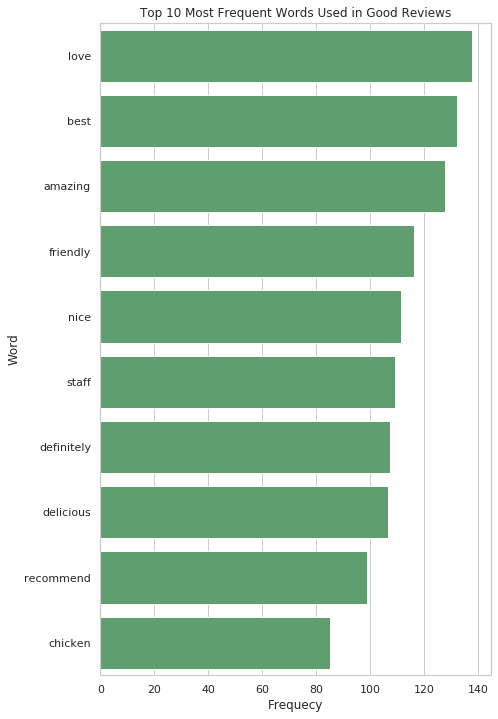

In [94]:
sns.set_color_codes("pastel")
sns.set(style="whitegrid")

plt.figure(figsize=(7,12))
sns.barplot(x=good_features[0], y=good_features['index'], color='g')
plt.title("Top 10 Most Frequent Words Used in Good Reviews")
plt.ylabel("Word")
plt.xlabel("Frequecy");

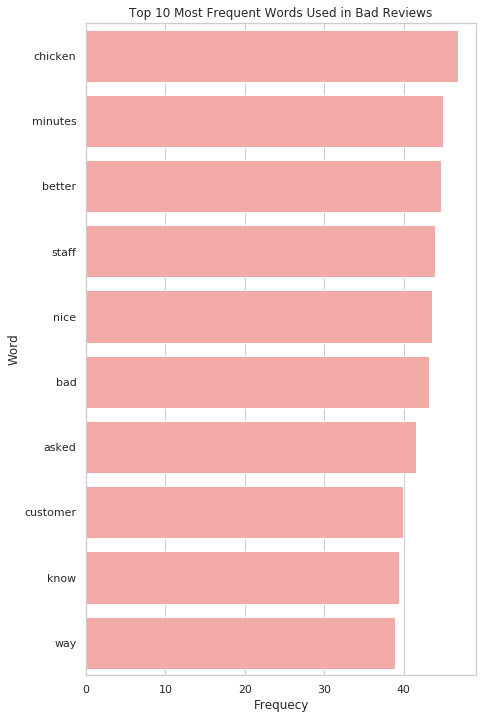

In [95]:
sns.set(style="whitegrid")
sns.set_color_codes("pastel")

plt.figure(figsize=(7,12))
sns.barplot(x=bad_features[0], y=bad_features['index'], color='r')
plt.title("Top 10 Most Frequent Words Used in Bad Reviews")
plt.ylabel("Word")
plt.xlabel("Frequecy");

## Part 4: Topic Modeling

Let's find out what those yelp reviews are saying! :D

1. Estimate a LDA topic model of the review text
    - Keep the `iterations` parameter at or below 5 to reduce run time
    - The `workers` parameter should match the number of physical cores on your machine.
2. Create 1-2 visualizations of the results
    - You can use the most important 3 words of a topic in relevant visualizations. Refer to yesterday's notebook to extract. 
3. In markdown, write 1-2 paragraphs of analysis on the results of your topic model

__*Note*__: You can pass the DataFrame column of text reviews to gensim. You do not have to use a generator.

In [33]:
from gensim.models import LdaMulticore
from gensim.corpora import Dictionary
import pyLDAvis.gensim
from gensim.models.coherencemodel import CoherenceModel

Learn the vocubalary of the yelp data:

In [42]:
id2word = corpora.Dictionary(yelp['tokens'])
len(id2word)

35475

Create a bag of words representation of the entire corpus

In [43]:
corpus = [id2word.doc2bow(text) for text in yelp['tokens']]

Your LDA model should be ready for estimation: 

In [44]:
lda = LdaMulticore(corpus=corpus,
                   id2word=id2word,
                   iterations=5,
                   workers=8,
                   num_topics = 10 # You can change this parameter
                  )

/home/andrew/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-LP5z51BA/lib/python3.7/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/home/andrew/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-LP5z51BA/lib/python3.7/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/home/andrew/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-LP5z51BA/lib/python3.7/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the futur

In [45]:
lda.print_topics()

[(0,
  '0.004*"best" + 0.004*"ordered" + 0.004*"people" + 0.004*"amazing" + 0.004*"order" + 0.003*"nice" + 0.003*"restaurant" + 0.003*"said" + 0.003*"recommend" + 0.003*"told"'),
 (1,
  '0.004*"nice" + 0.004*"staff" + 0.004*"order" + 0.004*"restaurant" + 0.004*"definitely" + 0.003*"amazing" + 0.003*"best" + 0.003*"went" + 0.003*"ordered" + 0.003*"friendly"'),
 (2,
  '0.004*"came" + 0.004*"best" + 0.004*"little" + 0.004*"staff" + 0.003*"recommend" + 0.003*"nice" + 0.003*"ordered" + 0.003*"went" + 0.003*"friendly" + 0.003*"wait"'),
 (3,
  '0.004*"came" + 0.004*"order" + 0.004*"love" + 0.004*"nice" + 0.003*"best" + 0.003*"way" + 0.003*"restaurant" + 0.003*"friendly" + 0.003*"went" + 0.003*"menu"'),
 (4,
  '0.005*"nice" + 0.004*"went" + 0.004*"ordered" + 0.004*"love" + 0.003*"amazing" + 0.003*"definitely" + 0.003*"right" + 0.003*"experience" + 0.003*"menu" + 0.003*"came"'),
 (5,
  '0.005*"love" + 0.004*"chicken" + 0.004*"staff" + 0.004*"ordered" + 0.004*"best" + 0.004*"order" + 0.004*"deli

Create 1-2 visualizations of the results

In [46]:
words = [re.findall(r'"([^"]*)"',t[1]) for t in lda.print_topics()]
topics = [' '.join(t[0:5]) for t in words]
for id, t in enumerate(topics): 
    print(f"------ Topic {id} ------")
    print(t, end="\n\n")

------ Topic 0 ------
best ordered people amazing order

------ Topic 1 ------
nice staff order restaurant definitely

------ Topic 2 ------
came best little staff recommend

------ Topic 3 ------
came order love nice best

------ Topic 4 ------
nice went ordered love amazing

------ Topic 5 ------
love chicken staff ordered best

------ Topic 6 ------
came best staff love order

------ Topic 7 ------
best love order definitely nice

------ Topic 8 ------
love delicious restaurant little went

------ Topic 9 ------
definitely best friendly nice love



In [47]:
pyLDAvis.enable_notebook()

pyLDAvis.gensim.prepare(lda, corpus, id2word)

/home/andrew/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-LP5z51BA/lib/python3.7/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.000767  0.003090       1        1  10.546051
6     -0.000106  0.000092       2        1  10.484312
2     -0.000819  0.001828       3        1  10.234961
3     -0.002612  0.000242       4        1  10.192637
0      0.002282  0.001506       5        1  10.125617
8      0.002711  0.003721       6        1  10.005431
5      0.004587 -0.003780       7        1   9.955636
1     -0.002042 -0.001637       8        1   9.867657
7      0.000733 -0.003212       9        1   9.734615
9     -0.003968 -0.001849      10        1   8.853086, topic_info=     Category         Freq        Term        Total  loglift  logprob
36    Default  1429.000000        came  1429.000000  30.0000  30.0000
378   Default  1423.000000       order  1423.000000  29.0000  29.0000
126   Default  1274.000000      people  1274.000000  28.0000  28.0000
349   Default  1114.000000   delicious  1114.000000  27.0000  27.0000
87    Default  1586.000000        nice  1586.000000  26.0000  26.0000
176   Default  1071.000000   recommend  1071.000000  25.0000  25.0000
516   Default   901.000000        told   901.000000  24.0000  24.0000
732   Default  1536.000000        love  1536.000000  23.0000  23.0000
1285  Default  1413.000000     ordered  1413.000000  22.0000  22.0000
132   Default   774.000000         bit   774.000000  21.0000  21.0000
184   Default  1210.000000     amazing  1210.000000  20.0000  20.0000
348   Default  1330.000000  definitely  1330.000000  19.0000  19.0000
1296  Default  1268.000000     chicken  1268.000000  18.0000  18.0000
80    Default   704.000000        long   704.000000  17.0000  17.0000
35    Default   927.000000        wait   927.000000  16.0000  16.0000
1075  Default  1079.000000         new  1079.000000  15.0000  15.0000
493   Default   592.000000      prices   592.000000  14.0000  14.0000
372   Default  1304.000000      little  1304.000000  13.0000  13.0000
656   Default   665.000000      drinks   665.000000  12.0000  12.0000
131   Default   843.000000         bar   843.000000  11.0000  11.0000
433   Default  1072.000000         day  1072.000000  10.0000  10.0000
112   Default  1367.000000        went  1367.000000   9.0000   9.0000
303   Default   979.000000        want   979.000000   8.0000   8.0000
428   Default   533.000000       check   533.000000   7.0000   7.0000
394   Default   592.000000      server   592.000000   6.0000   6.0000
1228  Default   569.000000      coffee   569.000000   5.0000   5.0000
769   Default   482.000000       cream   482.000000   4.0000   4.0000
44    Default   531.000000       sweet   531.000000   3.0000   3.0000
30    Default  1117.000000        said  1117.000000   2.0000   2.0000
332   Default   589.000000         big   589.000000   1.0000   1.0000
...       ...          ...         ...          ...      ...      ...
142   Topic10    63.794735         hot   584.940002   0.2086  -6.4203
1228  Topic10    62.332287      coffee   569.615662   0.2119  -6.4434
150   Topic10    86.520134       price   847.074890   0.1430  -6.1156
8     Topic10    63.879326      called   594.257751   0.1941  -6.4189
418   Topic10   102.383530      better  1059.742188   0.0873  -5.9472
526   Topic10    86.908562        work   868.181885   0.1229  -6.1111
675   Topic10    65.928192   excellent   619.765503   0.1836  -6.3874
149   Topic10    95.608368      pretty   994.891235   0.0820  -6.0157
255   Topic10   107.809998  experience  1155.523682   0.0525  -5.8956
1296  Topic10   115.982620     chicken  1268.974609   0.0319  -5.8225
112   Topic10   122.272041        went  1367.484497   0.0099  -5.7697
176   Topic10   100.236145   recommend  1071.654785   0.0550  -5.9684
441   Topic10    78.579681         eat   799.760132   0.1042  -6.2118
721   Topic10    61.445839       drink   584.913391   0.1711  -6.4578
117   Topic10   134.165070        best  1598.599731  -0.0534  -5.6769
172   Topic10   103

In [48]:
def compute_coherence_values(dictionary, corpus, limit, start=2, step=3, passes=5):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    limit : Max num of topics
    passes: the number of times the entire lda model & coherence values are calculated

    Returns:
    -------
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    
    coherence_values = []
    
    for iter_ in range(passes):
        for num_topics in range(start, limit, step):
            model = LdaMulticore(corpus=corpus, num_topics=num_topics, id2word=dictionary, workers=4)
            coherencemodel = CoherenceModel(model=model,dictionary=dictionary,corpus=corpus, coherence='u_mass')
            coherence_values.append({'pass': iter_, 
                                     'num_topics': num_topics, 
                                     'coherence_score': coherencemodel.get_coherence()
                                    })

    return coherence_values

In [ ]:
# Can take a long time to run.
coherence_values = compute_coherence_values(dictionary= id2word, 
                                                        corpus=corpus,
                                                        start=2, 
                                                        limit=40, 
                                                        step=6,
                                                        passes=20)

/home/andrew/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-LP5z51BA/lib/python3.7/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/home/andrew/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-LP5z51BA/lib/python3.7/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/home/andrew/.local/share/virtualenvs/DS-Unit-4-Sprint-1-NLP-LP5z51BA/lib/python3.7/site-packages/gensim/models/ldamodel.py:826: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the futur

In [101]:
topic_coherence = pd.DataFrame.from_records(coherence_values)

NameError: name 'coherence_values' is not defined

In [ ]:
topic_coherence.head()

In [ ]:
ax = sns.lineplot(x="num_topics", y="coherence_score", data=topic_coherence)

## Stretch Goals

Complete one of more of these to push your score towards a three: 
* Incorporate named entity recognition into your analysis
* Compare vectorization methods in the classification section
* Analyze more (or all) of the yelp dataset - this one is v. hard. 
* Use a generator object on the reviews file - this would help you with the analyzing the whole dataset.
* Incorporate any of the other yelp dataset entities in your analysis (business, users, etc.)